In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy.polynomial.polynomial as poly

import read_qdp
import os
import sys

Why is some data mirrored?

In [2]:
class IV_curve(object):
    '''
    
    Methods:
    self.plotPV() - plots PV graph
    self.plotIV() - plots IV graph
    self.plotPR() - plots PR graph
    self.plotRegions(raw=1) - set raw to false to plot analysed IV regions
    
    #TODO - Store the temperatures in the object
    '''
    
    def __init__(self, rawIV, params = 0, name='NA'): 
        ''' Creates a TES object from a pandas dataframe. 
        
        Reads the first two coloums of the dataframe and saves 
        them as attributes. Dataframe can consist of more coloums but they are ignored. 
        Params can be a list or tuple of values in this order [R_fb, M_ratio, R_shunt]
        R_stray can be inlcuded as extra paramter. Doing so will prevent the calc_R_stray method being used to 
        generate a value.
        
        Attriutes after initialisation:
        rawI (np.array[floats]), rawV (np.array[floats])
        raw_grad/raw_2grad (list[floats]) - 1st and 2nd differentials of rawIV
        superconducting (bool) - whether the data shows signs of superconductivity
        y_offset (float) 
        I_TES (list[floats]), V_bias (list[floats]) - Calibrated data
        R_fb, M_ratio, R_shunt (floats)- experimental parameters
        gain (float) - calcuated from M_ratio and R_fb
        R_stray (float) - either input or calculated
        P_TES , R_TES (floats) - Power and Resistance values
        rnn (float) 
        
        ohmic_reg, trans_reg, super_reg (ints) the demarcated regions. 
        If not super conducting ohmic_reg will be the entire data range
        '''
        # Drop NaNs in spreadsheet to prevent errors later 
        self.rawI = (rawIV.iloc[:,0].dropna()).values #Store as individual np.arrays for more readable code
        self.rawV = (rawIV.iloc[:,1].dropna()).values
        # Search for columns with T in the header then refine into BB or bath
        self.T_BB = rawIV.iloc[:,3].dropna().values
        self.T_bath = rawIV.iloc[:,4].dropna().values
        
        self.raw_grad = np.gradient(self.rawV, self.rawI)#Prevents repeated calls to gradient function later
        self.raw_2grad = np.gradient(self.raw_grad, self.rawI)
        self.superconducting = self.calc_superconducting() # This needs to be done first as other inits depend
        
        #iniditalise these values with the methods
        self.name = name
        self.y_offset = 0
        
        # All needed to calculate adjusted I and V etc. If params are included in initialisation, then they are
        # used. Otherwise defualts are used.
        # TODO: raise exception if len is not 3
        if params:
            try:
                self.R_fb = params[0]
                self.M_ratio = params[1]
                self.R_shunt = params[2]
            except IndexError:
                print("Error: Parameters not correct")
                return
        else:
            print("WARNING: Using defualt paramters")
            self.R_fb = 100099.6
            self.M_ratio = 18.9333333333333
            self.R_shunt = 0.00389
        
        self.gain = 1 / (self.R_fb * self.M_ratio)
        
        
    ############################calc_methods############################   
        
    def calc_I_TES(self, tweak=1):
        '''
        Generate I_tes (array) data from tweak(float), y_offset (float), gain (float).
        tweaks not yet used
        '''
        
        self.I_TES = [(entry - self.y_offset) * (10**6) * self.gain for entry in self.rawV]
        
    def calc_V_bias(self, tweak=1):
        '''
        Generates V_bias data
        '''
        self.V_bias = [((self.rawI[i]) * self.R_shunt) - (self.I_TES[i]*(self.R_shunt + self.R_stray)) for i in range(len(self.rawI))]
        
    def calc_P_TES(self):
        self.P_TES = [self.I_TES[index] * self.V_bias[index] for index in range(len(self.I_TES))]
        
    def calc_R_TES(self):
        self.R_TES = [self.V_bias[i] / self.I_TES[i] for i in range(len(self.V_bias))]
        
    def calc_superconducting(self):
        '''
        Test if the gradient deviates from the average by a significant margin. And save result in attribute.
        Returns the boolean value of self.superconducting
        '''
        grad = self.raw_grad
        grad_av = sum(grad)/len(grad)
        if max(grad) > 3*(grad_av) and abs(min(grad)) > 5*(grad_av):
            self.superconducting = True
        else:
            self.superconducting = False
    
        return self.superconducting
    
    ############################utility methods############################   
    
    def f(self, x, A, B):
        ''' 
        Function of straight line for optimisation function to find
        coefficients for.
        '''
        return A*x + B
        
    def fit_ohmic(self, inputdataX, inputdataY):
        ''' 
        Accepts two lists for X and Y vals and a tuple of indices. These are then used 
        to fit a straight line to the straight regions.
        Returns C, D, xvals. Which are the gradient, intercept and range of the fitted curve.
        '''
    
        r1start, r1end = (0,7)
        r2start, r2end = (-7,-1)
        
        firstx = min(inputdataX)
        lastx = max(inputdataX)
        xvals = np.linspace(firstx, lastx)

        #Slice the data in the frame and store in an array 
        yvals1 = inputdataY[r1start:r1end]
        yvals2 = inputdataY[r2start:r2end]
        lineDataY = np.append(yvals1, yvals2)
        
        xvals1 = inputdataX[r1start:r1end]
        xvals2 = inputdataX[r2start:r2end]
        lineDataX = np.append(xvals1, xvals2)

        #fit the sliced data to a line
        C, D = curve_fit(self.f, lineDataX, lineDataY)[0]

        return C , D , xvals
    
    def power_readout(self):
        indices = []
        count = 0 
        for index in range(len(self.raw_grad)):
            if self.raw_grad[index] < 0:
                count += 1
            if count >= 5:
                indices.append(index-count)
                break
                    
        count = 0
        for index in range(len(self.raw_grad)):
            if self.raw_grad[-index] < 0:
                count += 1
            else:
                count = 0
            if count >= 5:
                indices.append(index-count)
                break
        readout = (self.P_TES[indices[0]] +  self.P_TES[indices[1]])/2
        return readout
    
    ###############Plotting Methods###################
    def plotRaw(self):
        plt.scatter(self.rawI, self.rawV, label='Raw IV')
        plt.grid()
        plt.title(self.name)
        plt.show()
        
    def plotIV(self, plot = True):
        '''
        Plots the calibrated IV curve if plot is set to true in the args. Otherwise just calcs R_nn
        '''
        C, D , Axvals = self.fit_ohmic(self.V_bias, self.I_TES)
        self.rnn = 1/C
        if plot:
            fig, ax = plt.subplots()
            plt.plot(Axvals, self.f(Axvals, C , D), color='r', label='Load Line')
            plt.grid()
            plt.scatter(self.V_bias, self.I_TES, label='TES IV')
            ax.set_xlabel("Voltage (mV)")
            ax.set_ylabel("TES Current (mA)")
            plt.title("Calibrated IV Curve")
            ax.legend()
            
    def plotPR(self, name = ''):
        fig, ax = plt.subplots()
        plt.grid()
        plt.plot(self.R_TES, self.P_TES, label='TES PR')#, alpha=0.2)
        plt.title("Power vs Resistance Curve: Index - " + str(name))
        ax.set_xlabel("TES Resistance (ohm)")
        ax.set_ylabel("TES Power (fW)")
        
        if self.calc_superconducting():
            readout = self.power_readout()
            plt.axhline(readout, color='g',label=round(readout,5))
        
        plt.axvline(self.rnn, color='r',label='Rnn: ' + str(round(self.rnn,5)))
        plt.legend()
    
    def plotPV(self):
        fig, ax = plt.subplots()
        plt.grid()
        plt.scatter(self.V_bias, self.P_TES, label='TES PV')
        plt.title("Power Curve")
        ax.set_xlabel("Voltage (mV)")
        ax.set_ylabel("TES Power (fW)")
        
        if self.superconducting:
            readout = self.power_readout()
            plt.axhline(readout, color='g',label=round(readout,5))
        
        plt.legend()
        
        
        
    ###############Methods TODO###################
    def smooth_IV(): #Remove qunatum jumps?
        #TODO
        ''' Maybe a function to smooth noisy data before we find the 
        y offset. 
        Inputs: rawIV (or just use self?)
        Outputs: stores smoothRawIV in self
        '''
        pass
    
    def reject_outliers(self, data, m = 2.):
        d = np.abs(data - np.median(data))
        mdev = np.median(d)
        s = d/mdev if mdev else 0.
        return data[s<m]
    
    def y_search(self, step, pivot, precision):

        ys = []
        counts = []
        
        if step <= precision:
            self.y_offset = pivot
            return pivot
        
        
        for y_off in np.arange(pivot-(10*step),pivot+(step*10),step/10):
            I_TES = [(entry - y_off) * (10**6) * self.gain for entry in self.rawV]
            V_bias = [((self.rawI[i]) * self.R_shunt) - (I_TES[i]*(self.R_shunt + self.R_stray)) for i in range(len(self.rawI))]
            P_TES = [I_TES[index] * V_bias[index] for index in range(len(self.I_TES))]
            P_grad = np.gradient(P_TES)
            P_grad_smooth = self.reject_outliers(P_grad)
            R_TES = [V_bias[i] / I_TES[i] for i in range(len(V_bias))]
            count =0
            
            max_R = max(R_TES)
            
            for entry in P_grad_smooth:
                count += 5 * abs(entry)**2
            for i in range(int(len(R_TES)/2)-1):
                if (R_TES[i] > 0.95*max_R or R_TES[-i] > 0.95*max_R):
                    count += 2*(R_TES[i] - R_TES[-i])**2
            
            if np.average(R_TES) > 0:
                counts.append(count)
                ys.append(y_off)
        
        y_offset = ys[np.argmin(counts)]
        

        return self.y_search(step/10, y_offset, precision)
        
    def reverse_y_offset(self):
        '''Requires R_stray to have been already calculated or input.
        Attempts to calc offset through optimising the power plot. 
        '''
        self.y_search(5,0,0.000001)
        
    def calc_all(self):
        self.calc_I_TES()
        self.calc_V_bias()

        self.plotIV(False)
        self.calc_P_TES()
        self.calc_R_TES()

In [3]:
class IV_series(object):
    
    def __init__(self, dirname, params):
        self.R_nn = 0
        self.R_stray = 0 
        self.read_data(dirname)
        self.data = [IV_curve(series, params) for series in self.series]
        
        print(self.data)
    
    def set_R_stray(self, val):
        self.R_stray = val
        
    def set_rnn(self, val):
        self.R_nn = val
        
    def calc_R_stray(self):
        pass # TODO impliment 
        
        
    def calc_R_nn(self):
        average = 0
        for IV_curve in self.data:
            IV_curve.plotIV(False)
            average += IV_curve.rnn
        
        IV_series.R_nn = average/len(self.data)
    
    
    def read_data(self, dirname):
        series = []
        for filename in os.listdir(dirname):
            if filename.endswith(".qdp"):
                print(filename)
                series.append(read_qdp.read_qdp(dirname+ '\\' +filename))
        self.series = series    
        
    def plot_power(self):
        pass

In [4]:
s = IV_series('2013-05-23', [100002.9, 3.18541, 0.004567])

IV17UDShClosedBB_70.43mK_BB3.17K_magnet0uA.qdp
IV17UDShOpenBB_70.31mK_BB3.18K_magnet0uA.qdp
IVTES1_38.17mK_BB3.17K_magnet0uA.qdp
IVTES1_69.97mK_BB3.16K_magnet0uA.qdp
IVTES1_70.00mK_BB3.16K_magnet0uA.qdp
IVTES2gain10-8.8dBm_60.37mK_BB3.19K_magnet0uA.qdp
IVTES2gain101kHz_60.40mK_BB3.18K_magnet0uA.qdp
IVTES2gain10HBBshClosed_37.36mK_BB2.06K_magnet0uA.qdp
IVTES2gain10HBBshClosed_37.41mK_BB2.06K_magnet0uA.qdp
IVTES2gain10HBBshOpenMidGlobarOn_37.31mK_BB2.06K_magnet0uA.qdp
IVTES2gain10HBBshOpenMid_37.31mK_BB2.06K_magnet0uA.qdp
IVTES2gain10HBB_40.36mK_BB20.00K_magnet0uA.qdp
IVTES2gain10HBB_40.48mK_BB3.17K_magnet0uA.qdp
IVTES2gain10HBB_40.49mK_BB40.00K_magnet0uA.qdp
IVTES2gain10HBB_50.61mK_BB200.00K_magnet0uA.qdp
IVTES2gain10HBB_60.33mK_BB175.00K_magnet0uA.qdp
IVTES2gain10HBB_60.35mK_BB125.00K_magnet0uA.qdp
IVTES2gain10HBB_60.35mK_BB130.00K_magnet0uA.qdp
IVTES2gain10HBB_60.35mK_BB160.00K_magnet0uA.qdp
IVTES2gain10HBB_60.35mK_BB165.00K_magnet0uA.qdp
IVTES2gain10HBB_60.35mK_BB185.00K_magnet0uA.qd

C:\Users\callu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:1003: RuntimeWarning: divide by zero encountered in true_divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
C:\Users\callu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:1003: RuntimeWarning: invalid value encountered in true_divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
C:\Users\callu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:1004: RuntimeWarning: divide by zero encountered in true_divide
  b = (dx2 - dx1) / (dx1 * dx2)
C:\Users\callu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:1004: RuntimeWarning: invalid value encountered in true_divide
  b = (dx2 - dx1) / (dx1 * dx2)
C:\Users\callu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:1005: RuntimeWarning: divide by zero encountered in true_divide
  c = dx1 / (dx2 * (dx1 + dx2))
C:\Users\callu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:1005: RuntimeWarning: invalid value encountered in true_divide
  c = dx1 / (dx2 * (dx1 + dx2))
C:\Us

C:\Users\callu\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


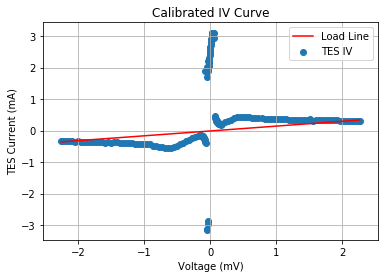

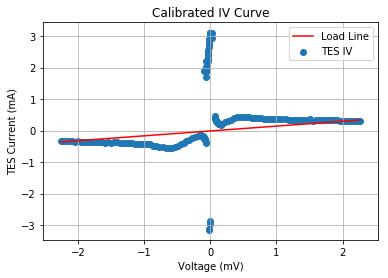

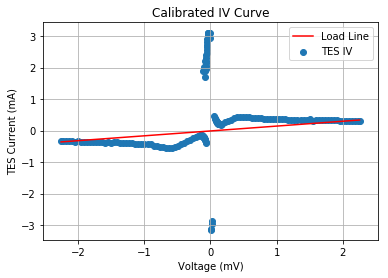

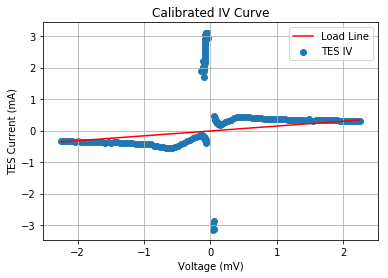

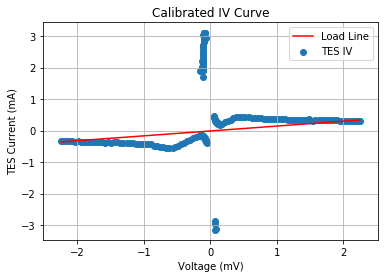

...

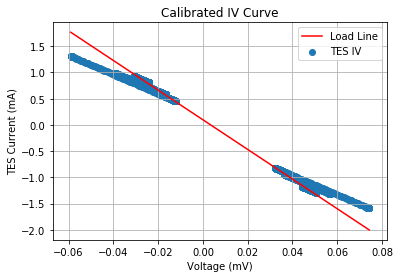

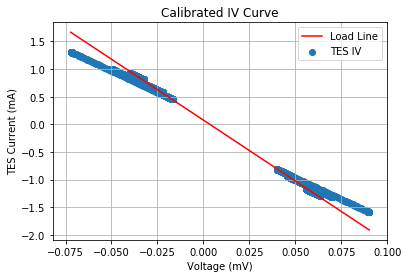

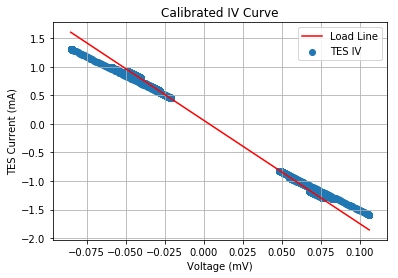

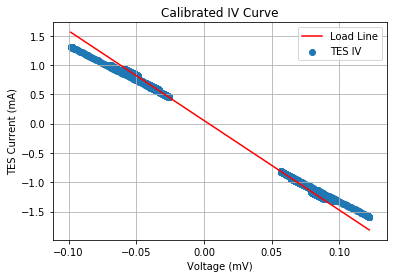

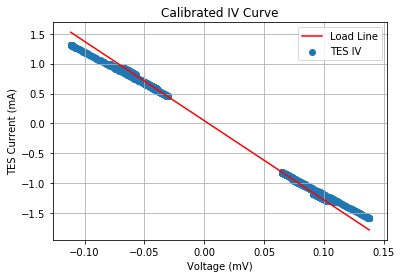

In [6]:
for entry in s.data:
    for i in range(10):
        entry.R_stray = i/1000
        entry.calc_all()
        entry.plotIV()

In [54]:
print(len(s.data))

83


In [66]:
params17D = [30002.9, 18.93333, 0.001278]
dataDict = pd.read_excel(r'C:\Users\callu\Dropbox\University\Year 3\Block 2b\Project\Data\17D_CBB_low.xls', sheet_name=None)
mes_set_17D = [TES(sheet, params17D, name) for name, sheet in dataDict.items()]

           bias  V fb (V)      I bias    V bias     I TES  Load Line  \
0   -111.991719 -0.546705 -111.991719 -0.140403 -0.945863  -0.936021   
1   -111.007737 -0.543079 -111.007737 -0.139164 -0.939480  -0.927760   
2   -110.005533 -0.539278 -110.005533 -0.137903 -0.932788  -0.919350   
3   -109.003329 -0.535341 -109.003329 -0.136642 -0.925857  -0.910944   
4   -108.001126 -0.531625 -108.001126 -0.135380 -0.919316  -0.902531   
5   -106.998922 -0.527790 -106.998922 -0.134118 -0.912564  -0.894122   
6   -105.996718 -0.524079 -105.996718 -0.132856 -0.906032  -0.885708   
7   -104.994514 -0.520450 -104.994514 -0.131594 -0.899643  -0.877292   
8   -103.992311 -0.516628 -103.992311 -0.130332 -0.892915  -0.868882   
9   -103.008329 -0.512905 -103.008329 -0.129094 -0.886361  -0.860625   
10  -102.006125 -0.509426 -102.006125 -0.127831 -0.880237  -0.852203   
11  -101.003921 -0.505485 -101.003921 -0.126570 -0.873299  -0.843798   
12  -100.001717 -0.501909 -100.001717 -0.125307 -0.867004  -0.83

           bias  V fb (V)      I bias    V bias     I TES  Load Line  \
0   -111.991719 -0.545175 -111.991719 -0.140406 -0.945016  -0.936038   
1   -111.007737 -0.541426 -111.007737 -0.139167 -0.938416  -0.927781   
2   -110.005533 -0.537597 -110.005533 -0.137906 -0.931675  -0.919371   
3   -109.003329 -0.533939 -109.003329 -0.136643 -0.925236  -0.910956   
4   -108.001126 -0.530008 -108.001126 -0.135383 -0.918316  -0.902550   
5   -106.998922 -0.526067 -106.998922 -0.134122 -0.911378  -0.894145   
6   -105.996718 -0.522324 -105.996718 -0.132860 -0.904790  -0.885732   
7   -104.994514 -0.518633 -104.994514 -0.131598 -0.898292  -0.877318   
8   -103.992311 -0.515000 -103.992311 -0.130335 -0.891895  -0.868902   
9   -103.008329 -0.511278 -103.008329 -0.129097 -0.885344  -0.860644   
10  -102.006125 -0.507463 -102.006125 -0.127835 -0.878628  -0.852234   
11  -101.003921 -0.503909 -101.003921 -0.126572 -0.872371  -0.843816   
12  -100.001717 -0.500130 -100.001717 -0.125311 -0.865718  -0.83

IndexError: single positional indexer is out-of-bounds